<h1>Extension of the Transmission Problem to Multiple Layered Boundaries</h1>
<h4>An Approximation of Cloaking Via the Periodic Trapezoid Rule</h4>

<h2>Introduction</h2>


Our goal is to simulate optical cloaking devices by calculating how light travels through defined boundaries.  Optical cloaking refers to the act of making something invisible in some directions by preventing the scattering of light as it hits the boundary.  We use boundary integral equation methods to compute the solution in layered boundaries.

In this notebook, we implement in Python an approximation through the use of two main functions: 
<ul>
    <li><u><i>find_boundary_data</i></u> - Implements the Kress Quadrature in order to find the values needed to solve the boundary integral equation system discussed in the next section.</li>
    <li><u><i>make_solution_grid</i></u> - Implements the Periodic Trapezoid Rule (PTR) to approximate the solution inside and outside the boundary in a body-fitted grid.</li>
</ul>

<h3>Numerical Method</h3>
Our method is derived from an integral equation system discussed in Kress's <i>Boundary Integral Equations</i> paper [1].  This system is one method of finding a solution to the Hemholtz equation.  These equations are rewritten using the same notation used in this notebook.

$\Delta u + k^2 u = 0 \hspace{70mm}$ (Hemholtz Wave Equation)

$u(x) = \int_{B}\frac{\partial \Phi (x,y)}{\partial \nu (y)}\mu(y) - ik\int_{B} \Phi (x,y) \mu (y) dy \hspace{22mm} $(Kress's Boundary Integral Equation)

$\Phi$ represents the fundamental solution to the Hemholtz Wave Equation: 
$\Phi (x,y) = \frac{i}{4} H_{0}^{(1)}(k\left|x - y\right |)$.<br><br>

<img src="Notebook Images\cloaking_image.JPG" alt="Drawing" style="width: 300px;" align="left"/>

For transmission, we extended the method to include the exterior and the interior of the boundary together.  We used two boundary integral equations to define the solution in the inside and the outside.  For cloaking, we must extend this method further to include a middle layer.  

We can consider the three-layer problem a set of two transmission problems: the transmission from the exterior to the layer, and the transmission from the layer to the interior.

<b><u>Exterior ➜ Layer </u></b><br>
$u_e(x) = f(x) + \int_{BE}\frac{\partial \Phi ^{e}}{\partial \nu(y)}(x,y) u_e(y) - \int_{BE}\Phi ^{e}(x,y)\frac{\partial u_e (y)}{\partial \nu (y)} d\sigma _y \quad x$ $\epsilon$ $E$

$u_l(x) = -\int_{BE}\frac{\partial \Phi ^{l}}{\partial \nu (y)}(x,y)u_l(y) + \int_{BE}\Phi ^{l} (x,y) \frac{\partial u_l(y)}{\partial \nu(y)}(y)d\sigma _y \quad x$ $\epsilon$ $L$

<b><u>Layer ➜ Interior </u></b><br>
$u_l(x) = u_e(x_{BE}) + \int_{BI}\frac{\partial \Phi ^{l}}{\partial \nu (y)}(x,y)u_l(y) - \int_{BI}\Phi ^{l} (x,y) \frac{\partial u_l(y)}{\partial \nu(y)}(y)d\sigma _y \quad x$ $\epsilon$ $L$

$u_i(x) = -\int_{BI}\frac{\partial \Phi ^{i}}{\partial \nu (y)}(x,y)u_i(y) + \int_{BI}\Phi ^{i} (x,y) \frac{\partial u_i(y)}{\partial \nu(y)}(y)d\sigma _y \quad x$ $\epsilon$ $I$

$BE$ refers to the domain of the boundary on the exterior.  $BI$ refers to the domain of the boundary on the interior.   $E$, $L$, and $I$ are the domains of the exterior, layer, and interior of the boundary, respectively.
Using the transmission conditions, $u_e = u_l$, $u_l = u_i$, $\frac{1}{k_e} \frac{\partial u_e}{\partial \nu} = \frac{1}{k_l} \frac{\partial u_l}{\partial \nu}$, and $\frac{1}{k_l} \frac{\partial u_l}{\partial \nu} = \frac{1}{k_i} \frac{\partial u_i}{\partial \nu}$, we can reduce each system to two unknowns.

<b><u>Exterior ➜ Layer (in terms of $u_e$)</u></b><br>
$u_e(x) = f(x) + \int_{BE}\frac{\partial \Phi ^{e}}{\partial \nu(y)}(x,y) u_e(y) - \int_{BE}\Phi ^{e}(x,y)\frac{\partial u_e (y)}{\partial \nu (y)} d\sigma _y \quad x$ $\epsilon$ $E$

$u_l(x) = -\int_{BE}\frac{\partial \Phi ^{l}}{\partial \nu (y)}(x,y)u_e(y) +\frac{k_l}{k_e}\int_{BE}\Phi ^{l} (x,y) \frac{\partial u_e(y)}{\partial \nu(y)}(y)d\sigma _y \quad x$ $\epsilon$ $L$

<b><u>Layer ➜ Interior (in terms of $u_i$) </u></b><br>
$u_l(x) =  g(x) + \int_{BI}\frac{\partial \Phi ^{l}}{\partial \nu (y)}(x,y)u_l(y) - \int_{BI}\Phi ^{l} (x,y) \frac{\partial u_l(y)}{\partial \nu(y)}(y)d\sigma _y \quad x$ $\epsilon$ $L$

$u_i(x) = -\int_{BI}\frac{\partial \Phi ^{i}}{\partial \nu (y)}(x,y)u_l(y) + \frac{k_i}{k_l}\int_{BI}\Phi ^{i} (x,y) \frac{\partial u_l(y)}{\partial \nu(y)}(y)d\sigma _y \quad x$ $\epsilon$ $I$

These systems of equations can be rewritten and turned into a matrix equations.  By solving these matrix systems for $u_e$, $\frac{\partial u_e}{\partial \nu}$, $u_i$, and $\frac{\partial u_i}{\partial \nu}$ on the boundary, those values can be used to approximate via the PTR the values of the exterior, layer, and interior.

$$(1) \begin{bmatrix} \frac{I}{2} - D^{e} & S^{e} \\ \frac{I}{2} + D^{l} & -\frac{k_l}{k_e}S^{l} \end{bmatrix} \begin{bmatrix}u_e \\ \frac{\partial u_e}{\partial \nu}\end{bmatrix} = \begin{bmatrix} f \\ 0 \end{bmatrix} \quad u_e \hspace{1mm} \epsilon \hspace{1mm}BE $$

$$(2) \begin{bmatrix} \frac{I}{2} - D^{l} & S^{l} \\ \frac{I}{2} + D^{i} & -\frac{k_i}{k_l}S^{i} \end{bmatrix} \begin{bmatrix}u_l \\ \frac{\partial u_l}{\partial \nu}\end{bmatrix} = \begin{bmatrix} g\\ 0 \end{bmatrix} \quad u_l \hspace{1mm} \epsilon \hspace{1mm}BI$$

<b><u> Solving System using (1) only</u></b>

It may also be possible to combine these systems into one using the relationship between the radius of the inner boundary and the outer boundary. 

Consider $y_{BI}(t) = \left<cos(t), sin(t)\right>$ and $y_{BE}(t) = \left<acos(t), asin(t)\right>$ for $a > 1$, such that the outer boundary's radius is $a$ times that of the inner boundary.

We derive our equations through parameterization of $y(t)$.  We know:

$\int_{BI} \Phi^{i}(x,y)\frac{\partial u_e(y)}{\partial \nu(y)} d\sigma_y = \int_0^{2\pi} \Phi^{i}(x,y(t))\frac{\partial u_i(y(t))}{\partial \nu(y(t))}\left|y'(t)\right|dt$ $\quad$ such that $\quad$ $\left|y'(t)\right| = \left|y'_{BI}(t)\right| = 1$

Because $\left|y'_{BI}(t)\right| = a\left|y'_{BE}(t)\right|$, we can say:
$\int_{BE} \Phi ^{e}(x,y)\frac{\partial u_e(y)}{\partial \nu(y)} d\sigma_y = a\int_{BI}\Phi^{i}(x,y)\frac{\partial u_i(y)}{\partial \nu(y)} d\sigma_y$ and $\int_{BE}\frac{\partial \Phi ^{e}}{\partial \nu(y)}(x,y) u_e(y) d\sigma_y = a\int_{BI}\frac{\partial \Phi ^{i}}{\partial \nu(y)}(x,y) u_i(y) d\sigma_y$

Then we only need to solve the full system for two unknowns, $u_e$ and $\frac{\partial u_e}{\partial \nu}$ because we know:

$u_l = -D^lu_e + \frac{k_l}{k_e}S^l\frac{\partial u_e}{\partial \nu} = aD^lu_i - a\frac{k_i}{k_l}S^l\frac{\partial u_i}{\partial \nu} \quad x$ $\epsilon$ $L$ $\quad$ such that $\quad$ $-D^lu_e =aD^lu_i$ and $\frac{k_l}{k_e}S^l\frac{\partial u_e}{\partial \nu} = - a\frac{k_i}{k_l}S^l\frac{\partial u_i}{\partial \nu}$

Therefore, we can rewrite our equation for $u_i(x)$ in terms of $u_e$ and $\frac{\partial u_e}{\partial \nu}$ given $u_i = -\frac{1}{a}u_e$ and $\frac{\partial u_i}{\partial \nu} = -\frac{1}{a}\frac{k_l^2}{k_ik_e}\frac{\partial u_e}{\partial \nu}$

$u_i = -D^iu_i + S^i\frac{\partial u_i}{\partial \nu} = \frac{1}{a}D^iu_e - \frac{1}{a}\frac{k_l^2}{k_ik_e}S^i\frac{\partial u_e}{\partial \nu} \quad x$ $\epsilon$ $I$

<h3>Variable Definitions</h3>

<b> Of the Boundary</b><br>
M = Number of points on the boundary<br>
J = Jacobian<br>
τ = Tangent Vector<br>
ν = Normal Vector<br>
κ = Curvature

<b> Of the PTR Approximation</b><br>
f = Source / Incidence field<br>
k = Wave Number<br>
x, y = Domain and range of the boundary<br>
v = Plot of the area captured by the function

<h2>Implementation</h2>

In [8]:
%matplotlib inline
import sympy as sp
import numpy as np
from sympy import cos, sin, exp
from numpy import sqrt, log
from scipy.special import hankel1
from scipy.special import jv as besselj
from scipy.linalg import toeplitz
from matplotlib import pyplot as plt
from numpy import vectorize
from mpl_toolkits.mplot3d import Axes3D

# For testing animated plots
from plotly.offline import plot, iplot, init_notebook_mode
from plotly.graph_objs import *
init_notebook_mode()
init_notebook_mode(connected=True)
from IPython.display import HTML

<h3>Boundary class definition</h3>

In [9]:
class Boundary:
    '''
    Defines the class Boundary, that contains geometric features of a boundary
    
    Attributes
    ==========
    param: parametrization of a boundary
    veloc: derivative of the parametrization
    accel: second derivative of the parametrization
    normal: normal vector to the boundary
    tangent: tangent vectors to the boundary
    curvature: signed curvature of the boundary
    jacobian: Jacobian of the boundary
    '''
    
    def __init__(self, b):
        self.y = b
    
    @property
    def yp(self):
        return [sp.diff(p, t) for p in self.y]
    @property
    def ypp(self):
        return [sp.diff(p, t) for p in self.yp]
    @property
    def J(self):
        v2 = [i**2 for i in self.yp]
        sv2 = sum(v2)
        return sp.sqrt(sv2).simplify()
    @property
    def τ(self):
        return [p/self.J for p in self.yp]
    @property
    def ν(self):
        if len(self.y) == 2:
            tmp = (self.yp[1]/self.J, -self.yp[0]/self.J )
            return tmp
        else:
            raise ValueError('Need to define the normal vector for higher dimensions')
    @property
    def κ(self): #curvature kappa
        if len(self.y) == 2:
            tmp = (self.yp[0]*self.ypp[1] - self.yp[1]*self.ypp[0])/self.J**3  
            return tmp.simplify()
        else:
            raise ValueError('Need to define the mean curvature for higher dimensions')

<h3>Calculation of $u$ and $\frac{\partial u}{\partial \nu}$ on the boundary (using Kress quadrature)</h3>

In [10]:
def find_boundary_data(f, xbdy, ybdy, ν, J, κ, M, k_e, k_l):
    '''
    Computes u and du/dv on the boundary by solving the BIE system
    
    Attributes
    ======
    kernel of the double layer, L
    kernel of the single layer, M
    solution on the boundary, u
    normal derivative on the boundary, dvu
    '''
    
    E_C =  np.euler_gamma # Euler's constant
    N = M / 2
    m = np.arange(1, N)
    k_ratio = k_l/k_e

    # Create array for ifft...
    a = [0]
    a.extend(1/m)
    a.append(1/N)
    a.extend((1/m)[::-1])

    Rj = -2 * np.pi * np.fft.ifft(a)
    R = np.real(toeplitz(Rj, Rj))

    # Prepare arrays for solving integral equation of the boundary (Kress pt. 2)
    A = np.zeros((2*M, 2*M), dtype=complex)
    F = np.zeros(2*M, dtype=complex)

    cosθ_mn = np.zeros((M,M))
    #distance_mn = np.zeros((M, M))
    logterm_mn = np.zeros((M, M))
    
    besselj_0e_mn = np.zeros((M, M), dtype=complex)
    besselj_1e_mn = np.zeros((M, M), dtype=complex)
    hankel1_0e_mn = np.zeros((M, M), dtype=complex)
    hankel1_1e_mn = np.zeros((M, M), dtype=complex)
    
    besselj_0l_mn = np.zeros((M, M), dtype=complex)
    besselj_1l_mn = np.zeros((M, M), dtype=complex)
    hankel1_0l_mn = np.zeros((M, M), dtype=complex)
    hankel1_1l_mn = np.zeros((M, M), dtype=complex)
    
    logterm_o = {}
    for i in range(-M,M):
        if i != 0: 
            logterm_o[i] = log(float(4 * np.power(np.sin(0.5 * i * dt), 2)))
        
    
    for m in range(0, M):
        for n in range(0, M):
            rdiff = np.asarray([xbdy[m] - xbdy[n], ybdy[m] - ybdy[n]]);
            distance = sqrt(np.power(rdiff[:][0], 2) + np.power(rdiff[:][1], 2))
            #distance_mn[m,n] = distance
            besselj_0e_mn[m,n] = besselj(0, k_e * distance)
            besselj_0l_mn[m,n] = besselj(0, k_l * distance)
            if m != n:
                cosθ_mn[m, n] = ν[0][n]*(rdiff[0]/distance) + ν[1][n]*(rdiff[1]/distance)
                logterm_mn[m,n] = logterm_o[m-n]

                besselj_1e_mn[m,n] = besselj(1, k_e * distance)
                hankel1_1e_mn[m,n] = hankel1(1, k_e * distance)
                hankel1_0e_mn[m,n] = hankel1(0, k_e * distance)

                besselj_1l_mn[m,n] = besselj(1, k_l * distance)
                hankel1_1l_mn[m,n] = hankel1(1, k_l * distance)
                hankel1_0l_mn[m,n] = hankel1(0, k_l * distance)
            
    #Compute kernels of exterior of boundary
    L1_e = 0.5 * k_e / np.pi * J * cosθ_mn * besselj_1e_mn
    L2_e = 0.5 * 1j * k_e * J * cosθ_mn * hankel1_1e_mn - L1_e * logterm_mn
    M1_e = -0.5 / np.pi * J * besselj_0e_mn
    M2_e = 0.5 * 1j * J * hankel1_0e_mn - M1_e * logterm_mn
     
    diag = np.arange(0,M)
    M2_e[diag, diag] = J * ( 0.5 * 1j - E_C / np.pi - 0.5 / np.pi * np.log( 0.25 * np.power(k_e, 2) * np.power(J, 2)))
    L1_e[diag, diag] = 0
    L2_e[diag, diag] = 0.5 / np.pi * κ * J
            
    L_e = 0.5 * R * L1_e + 0.5 * (np.pi / N) * L2_e
    M_e = 0.5 * R * M1_e + 0.5 * (np.pi / N) * M2_e
                
    #Calculate kernels of interior of boundary
    L1_l = 0.5 * k_l / np.pi * J * cosθ_mn * besselj_1l_mn
    L2_l = 0.5 * 1j * k_l * J * cosθ_mn * hankel1_1l_mn - L1_l * logterm_mn
    M1_l = -0.5 / np.pi * J * besselj_0l_mn
    M2_l = 0.5 * 1j * J * hankel1_0l_mn - M1_l * logterm_mn
    
    #Replace diagonals where m=n with exception cases
    L1_l[diag, diag] = 0
    L2_l[diag, diag] = 0.5 / np.pi * κ * J;
    M2_l[diag, diag] = J * ( 0.5j - E_C / np.pi - 0.5 / np.pi * np.log( 0.25 * np.power(k_l, 2) * np.power(J, 2)))
    
    L_l =0.5 * R * L1_l + 0.5 * (np.pi / N) * L2_l
    M_l = 0.5 * R * M1_l + 0.5 *(np.pi / N) * M2_l

    #Matrix of combined representation formulas       
    A11 = 0.5 * np.identity(M) - L_e
    A12 = M_e
    A21 = 0.5 * np.identity(M) + L_l
    A22 = -k_ratio * M_l

    #Combine A's into one matrix, A
    A[0:M, 0:M] = A11; A[0:M, M: 2*M] = A12
    A[M: 2*M, 0:M] = A21; A[M: 2*M, M: 2*M] = A22
    
    #Make matrix for f and 0's, call it F
    F[0:M] = f
    
    #Solve for u and dvu from AU = F
    U = np.linalg.solve(A,F)
    u_e = U[0:M]
    dvu_e = U[M: 2*M]
    return u_e, dvu_e

<h3>Calculation of solution grid (using Periodic Trapezoid Rule)</h3>

In [11]:
def make_grid(ngrid, xbdy, ybdy, ν, D):
    dn = D/ngrid
    rgrid = np.arange(0+dn, D, dn)
    
    x_e  = np.zeros((M + 1, ngrid - 1))
    y_e  = np.zeros((M + 1, ngrid - 1))
    x_l  = np.zeros((M + 1, ngrid - 1))
    y_l  = np.zeros((M + 1, ngrid - 1))
    x_i  = np.zeros((M + 1, ngrid - 1))
    y_i  = np.zeros((M + 1, ngrid - 1))

    #Can move grid calculation to its own function...
    for m in range(0, M):
        x_e[m, :] = xbdy[m] + rgrid*ν[0][m]
        y_e[m, :] = ybdy[m] + rgrid*ν[1][m]
        x_l[m, :] = xbdy[m] - rgrid*ν[0][m]
        y_l[m, :] = ybdy[m] - rgrid*ν[1][m]
        x_i[m, :] = xbdy[m] -(D + rgrid)*ν[0][m]
        y_i[m, :] = ybdy[m] -(D + rgrid)*ν[1][m]
        
    return x_e, y_e, x_l, y_l, x_i, y_i

In [12]:
def make_solution_grid(uE, dvuE, uL, dvuL, x_e, y_e, x_l, y_l, x_i, y_i, ν, J, κ, Ji, M, k_e, k_l, k_i):
    '''
    Calculate the solution for interior and exterior domains using u and dvu
    
    Attributes
    ==========
    domain and range values for plot of the solution grid, x and y
    approximation of the solution using PTR, v
    exact solution for known case of ke = ki, exact
    
    '''
    # Find the absolute maximum curvature |κ|max
    # κ_max = np.amax(np.abs(κ))
    '''
    dn = D/ngrid
    rgrid = np.arange(0+dn, D, dn)

    x_e  = np.zeros((M + 1, ngrid - 1))
    y_e  = np.zeros((M + 1, ngrid - 1))
    x_l  = np.zeros((M + 1, ngrid - 1))
    y_l  = np.zeros((M + 1, ngrid - 1))
    x_i  = np.zeros((M + 1, ngrid - 1))
    y_i  = np.zeros((M + 1, ngrid - 1))

    #Can move grid calculation to its own function...
    for m in range(0, M):
        x_e[m, :] = xbdy[m] + rgrid*ν[0][m]
        y_e[m, :] = ybdy[m] + rgrid*ν[1][m]
        x_l[m, :] = xbdy[m] - rgrid*ν[0][m]
        y_l[m, :] = ybdy[m] - rgrid*ν[1][m]
        x_i[m, :] = xbdy[m] -(D + rgrid)*ν[0][m]
        y_i[m, :] = ybdy[m] -(D + rgrid)*ν[1][m]
   ''' 
    k_ratio1 = k_l/k_e
    k_ratio2 = (k_l**2)/(k_i*k_e)

    # Allocate memory for the solution
    kernelD_e_mn = np.zeros((M + 1, ngrid - 1), dtype=complex)
    kernelS_e_mn = np.zeros((M + 1, ngrid - 1), dtype=complex)
    kernelD_l_mn = np.zeros((M + 1, ngrid - 1), dtype=complex)
    kernelS_l_mn = np.zeros((M + 1, ngrid - 1), dtype=complex)
    kernelD_i_mn = np.zeros((M + 1, ngrid - 1), dtype=complex)
    kernelS_i_mn = np.zeros((M + 1, ngrid - 1), dtype=complex) 
    
    f = np.exp(1j * k_e * (np.cos(alpha) * x_e + np.sin(alpha) * y_e))
    #g = np.exp(1j * k_l * (np.cos(alpha) * x_l + np.sin(alpha) * y_l))
    #Ask about simplifying loops, because Kernels are each size MxN and each used to sum single index of v_i and v_e...
    for m in range(0, M):
        for n in range(0, ngrid-1):
            #EXTERIOR:
            xe_diff = x_e[m][n] - xbdy
            ye_diff = y_e[m][n] - ybdy
        
            distance_e = sqrt(xe_diff**2 + ye_diff**2) #(r in kress)
            cosθ_e = (ν[0][:]*xe_diff + ν[1][:]*ye_diff ) / distance_e;
    
            
            kernelD_e = 0.25 * 1j * k_e * cosθ_e * hankel1(1, k_e*distance_e)
            kernelS_e = 0.25 * 1j * hankel1(0, k_e*distance_e) # kress (2.2+)
            
            kernelD_e_mn[m,n] = sum(kernelD_e * J * uE)
            kernelS_e_mn[m,n] = sum(kernelS_e * J * dvuE)
            
            # LAYER:
            xl_diff = x_l[m][n] - xbdy
            yl_diff = y_l[m][n] - ybdy
            
            distance_l = sqrt(xl_diff**2 + yl_diff**2) #(r in kress)
            cosθ_l = (ν[0][:]*xl_diff + ν[1][:]*yl_diff) / distance_l
            
            kernelD_l = 0.25 * 1j * (k_l * cosθ_l * hankel1(1, k_l*distance_l))
            kernelS_l = 0.25 * 1j * hankel1(0, k_l*distance_l)
           
            kernelD_l_mn[m,n] = sum(kernelD_l * J * uE)
            kernelS_l_mn[m,n] = sum(kernelS_l * J * dvuE)
            
            # INTERIOR:
            xi_diff = x_i[m][n] - xbdy
            yi_diff = y_i[m][n] - ybdy
            
            distance_i = sqrt(xi_diff**2 + yi_diff**2) #(r in kress)
            cosθ_i = (ν[0][:]*xi_diff + ν[1][:]*yi_diff) / distance_i
            
            kernelD_i = 0.25 * 1j * (k_i * cosθ_i * hankel1(1, k_i*distance_i))
            kernelS_i = 0.25 * 1j * hankel1(0, k_i*distance_i)
            
            kernelD_i_mn[m,n] = sum(kernelD_i * Ji * uL)
            kernelS_i_mn[m,n] = sum(kernelS_i * Ji * dvuL)
            
    
    v_e = f + kernelD_e_mn * dt - kernelS_e_mn * dt
    v_l = -kernelD_l_mn * dt + k_ratio1 * kernelS_l_mn * dt
    #v_i = -(kernelD_i_mn * dt - k_ratio2 * kernelS_i_mn * dt) #flip sign compared to theory
    #v_l2 = g + kernelD_l_mn * dt - kernelS_l_mn * dt
    #assert np.allclose(v_l, v_l2)
    
    uL_BI = v_l[:, ngrid - 2]
    
    v_i = -kernelD_i_mn * dt + (k_i/k_l) * kernelS_i_mn * dt
    #Impose Periodicity
    x_e[M][:] = x_e[0][:]
    y_e[M][:] = y_e[0][:]
    v_e[M][:] = v_e[0][:]
    
    x_l[M][:] = x_l[0][:]
    y_l[M][:] = y_l[0][:]
    v_l[M][:] = v_l[0][:]
    
    x_i[M][:] = x_i[0][:]
    y_i[M][:] = y_i[0][:]
    v_i[M][:] = v_i[0][:]

    return v_e, v_l, v_i

In [13]:
def find_exact_planewave(x_e, x_l, x_i, y_e, y_l, y_i, k_e, k_l, k_i, alpha):
    exact_e = np.exp(1j * k_e * (np.cos(alpha) * x_e + np.sin(alpha) * y_e))
    exact_l = np.exp(1j * k_l * (np.cos(alpha) * x_l + np.sin(alpha) * y_l))
    exact_i = np.exp(1j * k_i * (np.cos(alpha) * x_i + np.sin(alpha) * y_i))
    return exact_e, exact_l, exact_i

<h2>Numerical results</h2>

In order to validate our method, we will firstly display the results for a case such that the solution is known.  This solution is such that:
$$f(x) = e^{i k_e (cos(\alpha)x + sin(\alpha)y)}$$
$$k_e = k_i$$<br>
The values of $\alpha$, $k_e$, and $k_i$ are chosen below when we set the paramaters for our calculations.  Our solution is given by the value $v$ and is compared to the known solution, which we call $exact$.  This error is displayed on a log plot which follows the surface plots of the approximate and exact solutions.<br><br>

Our method is then use to examine our results for different scenarios.  For example, we apply our method for the case when $k_i = -0.5 k_e$.  We also test our method for different shapes of the boundary, such as a star-shaped boundary.

<h3>Defined Boundary Curves</h3>

In [14]:
# Specify the shape of the boundaries
t = sp.Symbol('t')

EllipseE = (4*cos(t), 4*sin(t)) #CC: edits ellipse into a circle
EllipseI = (3*cos(t), 3*sin(t))
Circle = (cos(t), sin(t))
Star = ((1+0.3*cos(5*t))*cos(t), (1+0.3*cos(5*t))*sin(t))
Kite = ((cos(t) + 0.65*cos(2*t) -0.65, 1.5*sin(t)))

E = Boundary(EllipseE)
I = Boundary(EllipseI)
K = Boundary(Kite)
C = Boundary(Circle)
S = Boundary(Star)

# Convert the sympy into numpy quantities
bdy_E = sp.lambdify(t, E.y)
ν_E = sp.lambdify(t, E.ν)
J_E = sp.lambdify(t, E.J)
κ_E = sp.lambdify(t, E.κ)

bdy_I = sp.lambdify(t, I.y)
ν_I = sp.lambdify(t, I.ν)
J_I = sp.lambdify(t, I.J)
κ_I = sp.lambdify(t, I.κ)

bdy_K = sp.lambdify(t, K.y)
ν_K = sp.lambdify(t, K.ν)
J_K = sp.lambdify(t, K.J)
κ_K = sp.lambdify(t, K.κ)

bdy_C = sp.lambdify(t, C.y)
ν_C = sp.lambdify(t, C.ν)
J_C = sp.lambdify(t, C.J)
κ_C = sp.lambdify(t, C.κ)

bdy_S = sp.lambdify(t, S.y)
ν_S = sp.lambdify(t, S.ν)
J_S = sp.lambdify(t, S.J)
κ_S = sp.lambdify(t, S.κ)

<h3>Initial condition and parameters</h3>

In [15]:
# Evaluate boundary data
def def_f_as_planewave(bdy, k, alpha):
    xbdy = bdy[0][:]
    ybdy = bdy[1][:]
    
    # Plane Wave Equation
    f = np.exp(1j * k * (np.cos(alpha) * xbdy + np.sin(alpha) * ybdy))
    return xbdy, ybdy, f

<h2>Display of the results</h2>

<h3>Ellipse boundary where $k_e = k_i = 3$</h3>
We use this as a validation of our method since the solution is known for $k_e = k_i$.  When they are equal, this is the same as saying the interior and the exterior are the same medium, so there no change in the source $f$ across the boundary.

In [16]:
# Evaluation of the results for given parameters
# USER INPUTS: Modify M, k_e, k_i, and ngrid to modify results
M = 300
k_e = 3
k_l = 3
k_i = 3
alpha = np.pi / 5
ngrid = 49
# Values for parameterization of the boundary
dt = 2.0 * np.pi/(M)
θ = np.arange(0, 2* np.pi, dt)
D = 1 # Equal to 1 / max kappa which is 1 for circles

# Using bdy, ν, J, and κ function names for ellipse
xbdy, ybdy, f  = def_f_as_planewave(bdy_E(θ), k_e, alpha)
x_e, y_e, x_l, y_l, x_i, y_i = make_grid(ngrid, xbdy, ybdy, ν_E(θ), D)
uE, dvuE = find_boundary_data(f, xbdy, ybdy, ν_E(θ), J_E(θ), κ_E(θ), M, k_e, k_l)


xbdyI, ybdyI, fI  = def_f_as_planewave(bdy_I(θ), k_i, alpha)
uL, dvuL = find_boundary_data(-3/4*uE, xbdyI, ybdyI, ν_I(θ), J_I(θ), κ_I(θ), M, k_l, k_i)

<h4>Validation of the boundary data</h4>

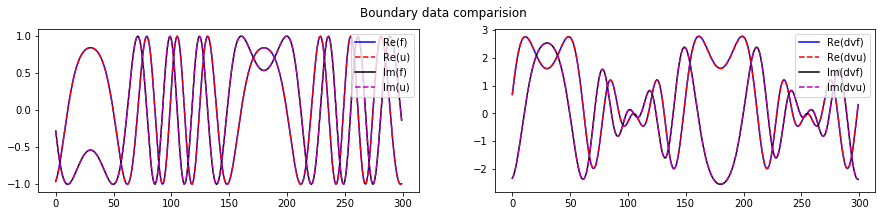

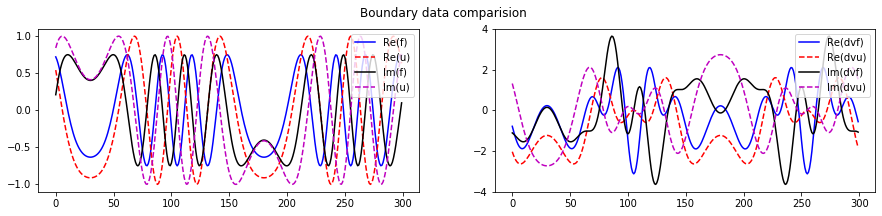

In [17]:
df = [1j * k_e * np.cos(alpha) * np.exp(1j * k_e * (np.cos(alpha) * xbdy + np.sin(alpha) * ybdy)), 1j * k_e * np.sin(alpha) * np.exp(1j * k_e * (np.cos(alpha) * xbdy + np.sin(alpha) * ybdy))]
dvf = ν_E(θ)[0] * df[0] + ν_E(θ)[1] * df[1]

fig = plt.figure(figsize=(15,3))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
fig.suptitle('Boundary data comparision');
ax1.plot(np.real(uE), 'b', label='Re(f)')
ax1.plot(np.real(f), 'r--', label='Re(u)')
ax1.plot(np.imag(uE), 'k', label='Im(f)')
ax1.plot(np.imag(f), 'm--', label='Im(u)')
ax1.legend(loc='upper right');
ax2.plot(np.real(dvuE), 'b', label='Re(dvf)')
ax2.plot(np.real(dvf), 'r--', label='Re(dvu)')
ax2.plot(np.imag(dvuE), 'k', label='Im(dvf)')
ax2.plot(np.imag(dvf), 'm--', label='Im(dvu)')
ax2.legend(loc='upper right');

dfI = [1j * k_l * np.cos(alpha) * np.exp(1j * k_l * (np.cos(alpha) * xbdyI + np.sin(alpha) * ybdyI)),
       1j * k_l * np.sin(alpha) * np.exp(1j * k_l * (np.cos(alpha) * xbdyI + np.sin(alpha) * ybdyI))]

dvfI = ν_I(θ)[0] * dfI[0] + ν_I(θ)[1] * dfI[1]

fig = plt.figure(figsize=(15,3))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
fig.suptitle('Boundary data comparision');
ax1.plot(np.real(uL), 'b', label='Re(f)')  # multiplyong by -4/3 makes it better
ax1.plot(np.real(fI), 'r--', label='Re(u)')
ax1.plot(np.imag(uL), 'k', label='Im(f)')
ax1.plot(np.imag(fI), 'm--', label='Im(u)')
ax1.legend(loc='upper right');
ax2.plot(np.real(dvuL), 'b', label='Re(dvf)')
ax2.plot(np.real(dvfI), 'r--', label='Re(dvu)')
ax2.plot(np.imag(dvuL), 'k', label='Im(dvf)')
ax2.plot(np.imag(dvfI), 'm--', label='Im(dvu)')
ax2.legend(loc='upper right');

As seen above, our calculation of $u_i$ (called u) and $\frac{\partial u_i}{\partial \nu}$ (called dvu) is accurate compared to the actual values of $f$ and $\frac{\partial f}{\partial \nu}$.  Therefore, we expect our final results to be accurate as well, so long as our method in _make-solution-grid_ is correct.

<h4>Compute the solution </h4>

In [18]:
v_e, v_l, v_i = make_solution_grid(uE, dvuE, uL, dvuL, x_e, y_e, x_l, y_l, x_i, y_i, ν_E(θ), 
                                                                J_E(θ), κ_E(θ), J_I(θ), M, k_e, k_l, k_i)
exact_e, exact_l, exact_i = find_exact_planewave(x_e, x_l, x_i, y_e, y_l, y_i, k_e, k_l, k_i, alpha)

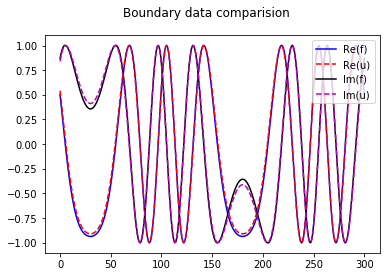

In [19]:
uL_BI = v_l[:, ngrid - 2] # Not actually on BI, but right before it, so should be close to actual

fig, ax1  = plt.subplots(1,1)
fig.suptitle('Boundary data comparision');
ax1.plot(np.real(uL_BI), 'b', label='Re(f)')  # multiplyong by -4/3 makes it better
ax1.plot(np.real(fI), 'r--', label='Re(u)')
ax1.plot(np.imag(uL_BI), 'k', label='Im(f)')
ax1.plot(np.imag(fI), 'm--', label='Im(u)')
ax1.legend(loc='upper right');

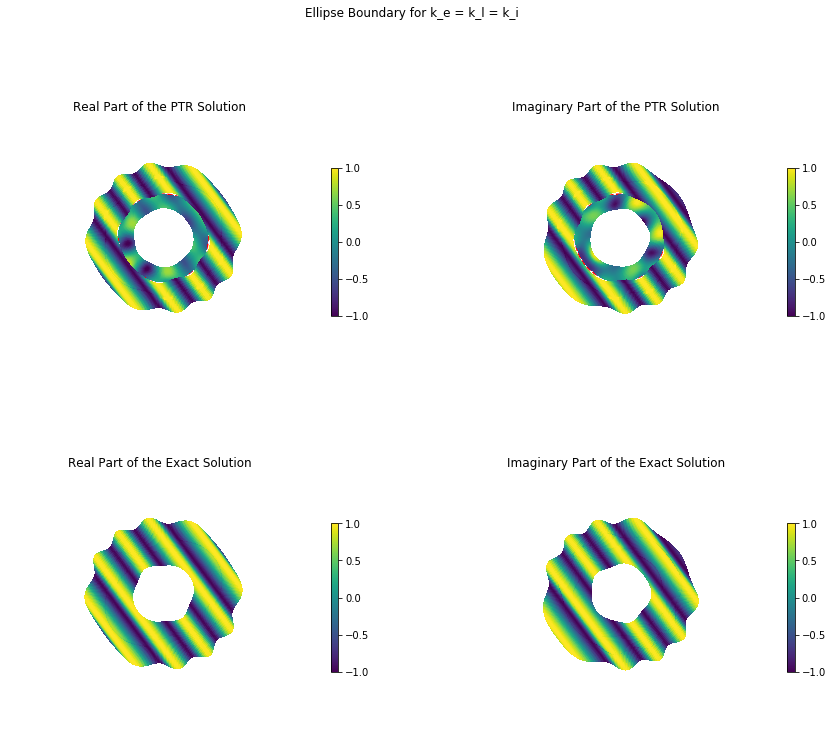

In [20]:
fig = plt.figure(figsize=(15,12))
fig.suptitle("Ellipse Boundary for k_e = k_l = k_i");
ax = fig.add_subplot(2 ,2 ,1, projection='3d')
ax.view_init(90,90)
real1 = ax.plot_surface(x_e, y_e, np.real(v_e), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = -1, vmax = 1, linewidth=0, antialiased=False)
real2 = ax.plot_surface(x_l, y_l, np.real(v_l), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = -1, vmax = 1, linewidth=0, antialiased=False)
real3 = ax.plot_surface(x_i, y_i, np.real(v_i), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = -1, vmax = 1, linewidth=0, antialiased=False)
ax.plot(xbdy, ybdy, 'r--')
ax.plot(x_i[:,0], y_i[:,0], 'r--')
plt.title("Real Part of the PTR Solution");
fig.colorbar(real1, shrink=0.5);
plt.axis('off')
plt.grid(b=None)

ax = fig.add_subplot(2, 2, 2, projection='3d')
ax.view_init(90,90)
imag1 = ax.plot_surface(x_e, y_e, np.imag(v_e), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = -1, vmax = 1, linewidth=0, antialiased=False)
imag2 = ax.plot_surface(x_l, y_l, np.imag(v_l), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = -1, vmax = 1, linewidth=0, antialiased=False)
imag3 = ax.plot_surface(x_i, y_i, np.imag(v_i), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = -1, vmax = 1, linewidth=0, antialiased=False)
ax.plot(xbdy, ybdy, 'r--')
ax.plot(x_i[:,0], y_i[:,0], 'r--')
plt.title("Imaginary Part of the PTR Solution");
fig.colorbar(imag1, shrink=0.5);
plt.axis('off')
plt.grid(b=None)

ax = fig.add_subplot(2 ,2 ,3, projection='3d')
ax.view_init(90,90)
real1 = ax.plot_surface(x_e, y_e, np.real(exact_e), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = -1, vmax = 1, linewidth=0, antialiased=False)
real2 = ax.plot_surface(x_l, y_l, np.real(exact_l), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = -1, vmax = 1, linewidth=0, antialiased=False)
real3 = ax.plot_surface(x_i, y_i, np.real(exact_i), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = -1, vmax = 1, linewidth=0, antialiased=False)
ax.plot(xbdy, ybdy, 'r--')
ax.plot(x_i[:,0], y_i[:,0], 'r--')
plt.title("Real Part of the Exact Solution");
fig.colorbar(real1, shrink=0.5);
plt.axis('off')
plt.grid(b=None)

ax = fig.add_subplot(2, 2, 4, projection='3d')
ax.view_init(90,90)
imag1 = ax.plot_surface(x_e, y_e, np.imag(exact_e), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = -1, vmax = 1, linewidth=0, antialiased=False)
imag2 = ax.plot_surface(x_l, y_l, np.imag(exact_l), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = -1, vmax = 1, linewidth=0, antialiased=False)
imag3 = ax.plot_surface(x_i, y_i, np.imag(exact_i), rstride=1, cstride=1, cmap=plt.get_cmap('viridis'), vmin = -1, vmax = 1, linewidth=0, antialiased=False)
ax.plot(xbdy, ybdy, 'r--')
ax.plot(x_i[:,0], y_i[:,0], 'r--')
plt.title("Imaginary Part of the Exact Solution");
fig.colorbar(imag1, shrink=0.5);
plt.axis('off')
plt.grid(b=None)

As seen above, our results using the PTR appear identical to the exact solution, which is known for $k_e = k_i$.  However, because small disparities may exist that cannot be seen by examination, we will also use a log plot of the error to evaluate how accurate our method is.

<h3>Error Plot for $k_e = k_i$ </h3>

In [21]:
# Need to extract min and max values of each surface to impose onto cmin and cmax
min_val = np.r_[log(np.absolute(v_e - exact_e)), log(np.absolute(v_l - exact_l)), log(np.absolute(v_i - exact_i))].min()
max_val = np.r_[log(np.absolute(v_e - exact_e)), log(np.absolute(v_l - exact_l)), log(np.absolute(v_i - exact_i))].max();
data= [Surface(x=x_e, y=y_e, z=log(np.absolute(v_e - exact_e)), cmin=min_val, cmax=max_val), Surface(x=x_l, y=y_l, z=log(np.absolute(v_l - exact_l)), cmin=min_val, cmax=max_val),Surface(x=x_i, y=y_i, z=log(np.absolute(v_i - exact_i)), cmin=min_val, cmax=max_val, showscale=False)]

layout=dict(xaxis=dict(zeroline=False),
            yaxis=dict(zeroline=False),
            width=600,
            height=600,
            margin=dict(l=50, r=50, b=100, t=100),
           title='Error Plot', hovermode='closest'
           )
          
figure1=dict(data=data, layout=layout)          
iplot(figure1)

Although our previous surface plots appeared identical, an examination of the error reveals signifcant error as we approach our boundary.  There is also odd behavior on the interior of the boundary, whereas the error is low everywhere outside the boundary as we get further from it.  We do expect to see this for our current method, because the fundamental solution $\Phi$ becomes nearly singular for $x - y$ close to 0. In the future, we hope to reduce the error near and inside the boundary.

Despite this error, we consider this a validation of our method.  Therefore, we can use it to examine how a source changes when it travels through different mediums.  This is done by making $k_e$ and $k_i$ equal to different values.  Two examples are shown below.

<h2>Issues (Resolved and Unresolved)</h2>


<h2>References</h2>
<ol>
    <li>R. Kress, Boundary Integral Equations in Time-Harmonic Acoustic Scattering. Math Comput. Model (1991).</li>
    <li>C. Carvalho, S. Khatri, and A.D. Kim, Asymptotic analysis for close evaluation of layer potentials, submitted. J. Comp. Phys. (2018).</li>
</ol>